In [44]:
import polars as pl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
import warnings
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
warnings.filterwarnings('ignore')
pyo.init_notebook_mode()
sns.set_style('darkgrid')

In [45]:
df = pd.read_csv("test.csv")
df.head()

,Unnamed: 0,client_id,target,age,gender,family_dependents,education_level,marital_status,income_category,card_category,...,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,change_in_trans_amount,total_trans_amt,total_trans_ct,change_in_trans_count,avg_utilization_ratio
0,0,768435383,Existing Customer,38,M,0,High School,Single,Less than $40K,Platinum,...,1,2,50000.0,10000,40000.0,0.300,15000000,25,0.200,0.100
1,1,741435323,Existing Customer,50,F,3,Graduate,Married,80𝐾−120K,Gold,...,3,500,30000.0,12000,18000.0,-0.200,20000,30,-0.100,0.350
2,0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Bronze,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
3,1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Bronze,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
4,2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Bronze,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000


#  1. Исследовательский анализ 

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10139 entries, 0 to 10138
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              10139 non-null  int64  
 1   client_id               10139 non-null  int64  
 2   target                  10139 non-null  object 
 3   age                     10139 non-null  int64  
 4   gender                  10139 non-null  object 
 5   family_dependents       10139 non-null  int64  
 6   education_level         10139 non-null  object 
 7   marital_status          10139 non-null  object 
 8   income_category         10139 non-null  object 
 9   card_category           10139 non-null  object 
 10  relationship_with_bank  10139 non-null  int64  
 11  total_products          10139 non-null  int64  
 12  months_inactive_12_mon  10139 non-null  int64  
 13  contacts_count_12_mon   10139 non-null  int64  
 14  credit_limit            10139 non-null

In [47]:
df.shape

(10139, 22)

In [48]:
df.dtypes

Unnamed: 0                  int64
client_id                   int64
target                     object
age                         int64
gender                     object
family_dependents           int64
education_level            object
marital_status             object
income_category            object
card_category              object
relationship_with_bank      int64
total_products              int64
months_inactive_12_mon      int64
contacts_count_12_mon       int64
credit_limit              float64
total_revolving_bal         int64
avg_open_to_buy           float64
change_in_trans_amount    float64
total_trans_amt             int64
total_trans_ct              int64
change_in_trans_count     float64
avg_utilization_ratio     float64
dtype: object

In [49]:
df.duplicated().sum()

0

In [50]:
fig = make_subplots(rows=2, cols=1)

box=go.Box(x=df['age'],name='Age box Plot',boxmean=True)
hyst=go.Histogram(x=df['age'],name='Гистограмма Возрастов')

fig.add_trace(box,row=1,col=1)
fig.add_trace(hyst,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Дистрибуция возрастов")
fig.show()

In [51]:

df["target"].value_counts()


target
Existing Customer    8510
Attrited Customer    1629
Name: count, dtype: int64

In [52]:
df.columns 


Index(['Unnamed: 0', 'client_id', 'target', 'age', 'gender',
       'family_dependents', 'education_level', 'marital_status',
       'income_category', 'card_category', 'relationship_with_bank',
       'total_products', 'months_inactive_12_mon', 'contacts_count_12_mon',
       'credit_limit', 'total_revolving_bal', 'avg_open_to_buy',
       'change_in_trans_amount', 'total_trans_amt', 'total_trans_ct',
       'change_in_trans_count', 'avg_utilization_ratio'],
      dtype='object')

In [53]:
ex.pie(df,names='education_level',title='Уровень образования',hole=0.33)

## Гипотеза:
1. Клиенты с высшим образованием могут иметь более стабильное финансовое положение и, возможно, меньшую склонность к оттоку.
2. Высокий процент клиентов со средним или отсутствующим образованием может сигнализировать о высоком риске оттока, особенно если они испытывают финансовые трудности.

In [54]:
ex.pie(df,names='income_category',title='Разные уровни заработка клиентов в процентном соотношении',hole=0.33)

## Гипотеза про Доход клиентов
1. Большая часть клиентов (35.2%) зарабатывает менее $40K. Это самая значительная группа. Такие клиенты могут быть более склонны к оттоку, особенно если они сталкиваются с финансовыми трудностями.
2. Второе место занимает категория с доходом $40K - $60K (17.7%). Это средний уровень дохода, и такие клиенты могут быть менее уязвимыми, чем первая группа.
3. Группа с доходом $80K - $120K составляет 15.2%, а $60K - $80K  -13.8%. Это категории клиентов с более высоким уровнем дохода, которые, вероятно, обладают большей финансовой стабильностью.
4. Неизвестный доход ("Unknown") составляет 11% – наличие такой доли неопределенных данных может усложнять анализ и предсказание оттока.
5. Доход свыше $120K (7.19%) и диапазон $80K - $120K (0.00986%) – это наименьшие группы. Скорее всего, клиенты с такими доходами менее склонны к оттоку, так как у них больше финансовых ресурсов.1

In [55]:
ex.pie(df,names='marital_status',title='Семейный статус ',hole=0.33)


In [56]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['total_trans_amt'],name='Boxplot',boxmean=True)
tr2=go.Histogram(x=df['total_trans_amt'],name='Гистограмма')
    
fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Распределение общей суммы транзакций за последние 12 месяцев")
fig.show()

## На графике сверху видны большие выбросы, надо разобраться с этим

In [57]:
df['total_trans_amt'].describe()


count    1.013900e+04
mean     5.886189e+03
std      1.489633e+05
min      5.100000e+02
25%      2.156000e+03
50%      3.901000e+03
75%      4.741500e+03
max      1.500000e+07
Name: total_trans_amt, dtype: float64

- Максимальная сумма транзакций (max) составляет 15 миллионов, что значительно превышает 75-й процентиль (4741.5).
- Среднее значение (mean) 5886, но стандартное отклонение (std) 148 963 указывает на сильную дисперсию, вызванную выбросами.

In [58]:
# df['log_total_trans_amt'] =  np.log1p(df['total_trans_amt'])
# пробовал log distribution чтобы уменьшить размерность, но не помогло 

In [59]:
df = df[df['total_trans_amt'] < 50000]  # Убираем слишком большие транзакции


In [60]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['total_trans_amt'],name='Boxplot',boxmean=True)
tr2=go.Histogram(x=df['total_trans_amt'],name='Гистограмма')
    
fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Распределение общей суммы транзакций за последние 12 месяцев")
fig.show()

## Теперь можно предположить что: 
- Большая часть клиентов совершает транзакции в диапазоне 1.5k - 6k, что можно считать нормой.
- Небольшая группа клиентов с высокими суммами (10k - 15k) – возможно, это премиальные клиенты или пользователи с высокой активностью.

In [61]:
df.columns

Index(['Unnamed: 0', 'client_id', 'target', 'age', 'gender',
       'family_dependents', 'education_level', 'marital_status',
       'income_category', 'card_category', 'relationship_with_bank',
       'total_products', 'months_inactive_12_mon', 'contacts_count_12_mon',
       'credit_limit', 'total_revolving_bal', 'avg_open_to_buy',
       'change_in_trans_amount', 'total_trans_amt', 'total_trans_ct',
       'change_in_trans_count', 'avg_utilization_ratio'],
      dtype='object')

In [62]:
ex.pie(df,names='target',title='Клиенты vs ушедших',hole=0.33)

### Таргетный класс не сбалинсированный, можем попробовать сделать upsampling позже

# 2. Preprocessing 

In [63]:
# категориальные целевые переменные преобразуем в бинарные
df.target = df.target.replace({'Attrited Customer': 1, 'Existing Customer': 0})


In [64]:
df.value_counts('target')

target
0    8509
1    1629
Name: count, dtype: int64

In [65]:
df.gender = df.gender.replace({'F': 1, 'M': 0})


In [66]:
df = pd.concat([df, pd.get_dummies(df['education_level']).drop(columns=['Unknown'])], axis=1)
df = pd.concat([df, pd.get_dummies(df['income_category']).drop(columns=['Unknown'])], axis=1)
df = pd.concat([df, pd.get_dummies(df['marital_status']).drop(columns=['Unknown'])], axis=1)
df = pd.concat([df, pd.get_dummies(df['card_category']).drop(columns=['Platinum'])], axis=1)


In [67]:
df.columns


Index(['Unnamed: 0', 'client_id', 'target', 'age', 'gender',
       'family_dependents', 'education_level', 'marital_status',
       'income_category', 'card_category', 'relationship_with_bank',
       'total_products', 'months_inactive_12_mon', 'contacts_count_12_mon',
       'credit_limit', 'total_revolving_bal', 'avg_open_to_buy',
       'change_in_trans_amount', 'total_trans_amt', 'total_trans_ct',
       'change_in_trans_count', 'avg_utilization_ratio', 'College',
       'Doctorate', 'Graduate', 'High School', 'Post-Graduate', 'Uneducated',
       '$120K +', '$40K - $60K', '$60K - $80K', '$80K - $120K', '80𝐾−120K',
       'Less than $40K', 'Divorced', 'Married', 'Single', 'Bronze', 'Gold',
       'Silver'],
      dtype='object')

In [68]:
df.drop(columns = ['Unnamed: 0', 'education_level','income_category','marital_status','card_category'],inplace=True)

## 
- Категориальные данные преобразовал в one-hot encoding
- Целевая переменная (target) переведена в 0 и 1 
- Пол закодирован в 0 и 1.


### Корреляция переменных

In [69]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Pearson Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                [0.8888888888888888, "rgb(215,48,39)"],
                [0.7777777777777778, "rgb(244,109,67)"],
                [0.6666666666666666, "rgb(253,174,97)"],
                [0.5555555555555556, "rgb(254,224,144)"],
                [0.4444444444444444, "rgb(224,243,248)"],
                [0.3333333333333333, "rgb(171,217,233)"],
                [0.2222222222222222, "rgb(116,173,209)"],
                [0.1111111111111111, "rgb(69,117,180)"],
                [0.0               , "rgb(49,54,149)"]]

s_val =df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=0.7,ygap=0.7,colorscale=colorscale),
    row=1, col=1
)


s_val =df.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=0.7,ygap=0.7,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Numeric Correaltions")
fig.show()

- Total_Trans_Amt  имеет сильную положительную корреляцию с Total_Trans_Ct (количество транзакций).
- Months_Inactive_12_mon коррелирует с Attrition_Flag, что логично – клиенты, которые давно не пользовались услугами, могут уйти.

### Unsampling

Как мы помним, у нас дисбаланс классов в таргете

In [70]:
oversample = SMOTE()
target_col = 'target'  
X_cols = df.columns.difference(['client_id', target_col])  

X, y = oversample.fit_resample(df[X_cols], df[target_col])
unsampled_df = X.assign(Churn=y)


In [71]:
# проверил сколько строк для каждого класса 
print(unsampled_df['Churn'].value_counts())


Churn
0    8509
1    8509
Name: count, dtype: int64


In [72]:
# df.columns

In [73]:
ohe_cols = [col for col in unsampled_df.columns if col.startswith(('Graduate', 'High School', 'Married', 'Divorced', 'Income', 'Card'))]
ohe_data = unsampled_df[ohe_cols].copy()
unsampled_df = unsampled_df.drop(columns=ohe_cols)


In [74]:
# Выбираем только OHE-категории
ohe_cols = [col for col in unsampled_df.columns if col in [
    '$120K +', '$40K - $60K', '$60K - $80K', '$80K - $120K', '80K–120K',
    'Bronze', 'College', 'Doctorate', 'Gold', 'Less than $40K', 'Post-Graduate'
]]

# Копируем их в ohe_data для PCA
ohe_data = unsampled_df[ohe_cols].copy()

# Удаляем OHE-категории из usampled_df, оставляя важные признаки
unsampled_df = unsampled_df.drop(columns=ohe_cols)

# Проверяем, какие признаки остались
print("После исправления признаки в usampled_df:", unsampled_df.columns)


После исправления признаки в usampled_df: Index(['80𝐾−120K', 'Silver', 'Single', 'Uneducated', 'age', 'avg_open_to_buy',
       'avg_utilization_ratio', 'change_in_trans_amount',
       'change_in_trans_count', 'contacts_count_12_mon', 'credit_limit',
       'family_dependents', 'gender', 'months_inactive_12_mon',
       'relationship_with_bank', 'total_products', 'total_revolving_bal',
       'total_trans_amt', 'total_trans_ct', 'Churn'],
      dtype='object')


In [75]:
print("Типы данных в usampled_df:\n", unsampled_df.dtypes)


Типы данных в usampled_df:
 80𝐾−120K                     bool
Silver                       bool
Single                       bool
Uneducated                   bool
age                         int64
avg_open_to_buy           float64
avg_utilization_ratio     float64
change_in_trans_amount    float64
change_in_trans_count     float64
contacts_count_12_mon       int64
credit_limit              float64
family_dependents           int64
gender                      int64
months_inactive_12_mon      int64
relationship_with_bank      int64
total_products              int64
total_revolving_bal         int64
total_trans_amt             int64
total_trans_ct              int64
Churn                       int64
dtype: object


In [76]:
print("Колонки в usampled_df после удаления OHE-категорий:\n", unsampled_df.columns)


Колонки в usampled_df после удаления OHE-категорий:
 Index(['80𝐾−120K', 'Silver', 'Single', 'Uneducated', 'age', 'avg_open_to_buy',
       'avg_utilization_ratio', 'change_in_trans_amount',
       'change_in_trans_count', 'contacts_count_12_mon', 'credit_limit',
       'family_dependents', 'gender', 'months_inactive_12_mon',
       'relationship_with_bank', 'total_products', 'total_revolving_bal',
       'total_trans_amt', 'total_trans_ct', 'Churn'],
      dtype='object')


In [77]:
# Убираем все OHE-категории из основного датасета
unsampled_df = unsampled_df.drop(columns=ohe_cols, errors='ignore')



In [81]:
value_counts = df[df.columns[0]].value_counts()
print("Распределение классов до SMOTE:", value_counts)


Распределение классов до SMOTE: client_id
708387933    2
778632933    2
718333983    2
721174008    2
809307108    2
            ..
712521783    1
780045708    1
719488008    1
771575058    1
714337233    1
Name: count, Length: 10128, dtype: int64


In [83]:
# Проверяем наличие целевой переменной 'target' или 'Churn'
if 'target' in df.columns:
    target_col = 'target'
elif 'Target' in df.columns:
    target_col = 'Target'
elif 'Churn' in df.columns:
    target_col = 'Churn'
elif 'churn' in df.columns:
    target_col = 'churn'
else:
    print("Целевая переменная 'target' или 'Churn' не найдена.")
    print("Доступные колонки:", df.columns.tolist())
    target_col = input("Введите имя колонки с целевой переменной: ")

# Выводим информацию о распределении классов
print(f"Используем {target_col} как целевую переменную")
value_counts = df[target_col].value_counts()
print("Распределение классов до SMOTE:", value_counts)

# Определяем признаки (все колонки, кроме целевой)
feature_cols = [col for col in df.columns if col != target_col]

# Используем технику SMOTE для апсэмплинга
from imblearn.over_sampling import SMOTE

# Настраиваем SMOTE в зависимости от количества образцов
if min(value_counts) < 6:
    oversample = SMOTE(k_neighbors=min(min(value_counts)-1, 5))
else:
    oversample = SMOTE()

X = df[feature_cols]  # Признаки
y = df[target_col]    # Целевая переменная

# Выполняем апсэмплинг
X_resampled, y_resampled = oversample.fit_resample(X, y)
unsampled_df = X_resampled.copy()
unsampled_df[target_col] = y_resampled

Используем target как целевую переменную
Распределение классов до SMOTE: target
0    8509
1    1629
Name: count, dtype: int64


In [ ]:
# Проверяем наличие целевой переменной 'target' или 'Churn'
if 'target' in df.columns:
    target_col = 'target'
elif 'Target' in df.columns:
    target_col = 'Target'
elif 'Churn' in df.columns:
    target_col = 'Churn'
elif 'churn' in df.columns:
    target_col = 'churn'
else:
    print("Целевая переменная 'target' или 'Churn' не найдена.")
    print("Доступные колонки:", df.columns.tolist())
    target_col = input("Введите имя колонки с целевой переменной: ")

# Выводим информацию о распределении классов
print(f"Используем {target_col} как целевую переменную")
value_counts = df[target_col].value_counts()
print("Распределение классов до SMOTE:", value_counts)

# Определяем признаки (все колонки, кроме целевой)
feature_cols = [col for col in df.columns if col != target_col]

# Настраиваем SMOTE в зависимости от количества образцов
if min(value_counts) < 6:
    oversample = SMOTE(k_neighbors=min(min(value_counts)-1, 5))
else:
    oversample = SMOTE()

X = df[feature_cols]  # Признаки
y = df[target_col]    # Целевая переменная

# Выполняем апсэмплинг
X_resampled, y_resampled = oversample.fit_resample(X, y)
unsampled_df = X_resampled.copy()
unsampled_df[target_col] = y_resampled

Используем target как целевую переменную
Распределение классов до SMOTE: target
0    8509
1    1629
Name: count, dtype: int64


In [86]:
print("Распределение классов после SMOTE:")
print(unsampled_df[target_col].value_counts())

Распределение классов после SMOTE:
target
0    8509
1    8509
Name: count, dtype: int64


In [88]:
# Копируем OHE данные (столбцы с 15 до предпоследнего)
ohe_data = unsampled_df[unsampled_df.columns[15:-1]].copy()

# Удаляем OHE данные из основного датафрейма
unsampled_df = unsampled_df.drop(columns=unsampled_df.columns[15:-1])

# Выводим информацию о размерах полученных датафреймов
print(f"Размер основного датафрейма после удаления OHE: {unsampled_df.shape}")
print(f"Размер OHE данных: {ohe_data.shape}")

# Проверяем, какие столбцы остались в основном датафрейме
print("\nСтолбцы, оставшиеся в основном датафрейме:")
print(unsampled_df.columns.tolist())

Размер основного датафрейма после удаления OHE: (17018, 16)
Размер OHE данных: (17018, 19)

Столбцы, оставшиеся в основном датафрейме:
['client_id', 'age', 'gender', 'family_dependents', 'relationship_with_bank', 'total_products', 'months_inactive_12_mon', 'contacts_count_12_mon', 'credit_limit', 'total_revolving_bal', 'avg_open_to_buy', 'change_in_trans_amount', 'total_trans_amt', 'total_trans_ct', 'change_in_trans_count', 'target']


In [89]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Pearson Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                [0.8888888888888888, "rgb(215,48,39)"],
                [0.7777777777777778, "rgb(244,109,67)"],
                [0.6666666666666666, "rgb(253,174,97)"],
                [0.5555555555555556, "rgb(254,224,144)"],
                [0.4444444444444444, "rgb(224,243,248)"],
                [0.3333333333333333, "rgb(171,217,233)"],
                [0.2222222222222222, "rgb(116,173,209)"],
                [0.1111111111111111, "rgb(69,117,180)"],
                [0.0               , "rgb(49,54,149)"]]

s_val =unsampled_df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
    row=1, col=1
)


s_val =unsampled_df.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations")
fig.show()



- `target` теперь сбалансирован по классам, и связи стали более выраженными.
- Убраны лишние категориальные признаки (доход, образование, семейное положение), они могли мешать интерпретации.

In [90]:
ohe_data.head()

,avg_utilization_ratio,College,Doctorate,Graduate,High School,Post-Graduate,Uneducated,$120K +,$40K - $60K,$60K - $80K,$80K - $120K,80𝐾−120K,Less than $40K,Divorced,Married,Single,Bronze,Gold,Silver
0,0.350,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,True,False
1,0.061,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,True,False,False
2,0.105,False,False,True,False,False,False,False,False,False,False,False,True,False,False,True,True,False,False
3,0.000,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,True,False,False
4,0.760,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False


In [109]:
N_COMPONENTS = 8

pca_model = PCA(n_components = N_COMPONENTS )

pc_matrix = pca_model.fit_transform(ohe_data)

evr = pca_model.explained_variance_ratio_
total_var = evr.sum() * 100
cumsum_evr = np.cumsum(evr)

trace1 = {
    "name": "individual explained variance", 
    "type": "bar", 
    'y':evr}
trace2 = {
    "name": "cumulative explained variance", 
    "type": "scatter", 
     'y':cumsum_evr}
data = [trace1, trace2]
layout = {
    "xaxis": {"title": "Principal components"}, 
    "yaxis": {"title": "Explained variance ratio"},
  }
fig = go.Figure(data=data, layout=layout)
fig.update_layout(     title='Explained Variance Using {} Dimensions'.format(N_COMPONENTS))
fig.show()

In [110]:
unsampled_df_with_pcs = pd.concat([unsampled_df,pd.DataFrame(pc_matrix,columns=['PC-{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)

In [111]:
fig = ex.scatter_matrix(
    unsampled_df_with_pcs[['PC-{}'.format(i) for i in range(0,N_COMPONENTS)]].values,
    color=unsampled_df_with_pcs.credit_limit,
    dimensions=range(N_COMPONENTS),
    labels={str(i):'PC-{}'.format(i) for i in range(0,N_COMPONENTS)},
    title=f'Total Explained Variance: {total_var:.2f}%')

fig.update_traces(diagonal_visible=False)
fig.update_layout(
    coloraxis_colorbar=dict(
        title="credit_limit",
    ),
)
fig.show()

увеличение компонентов дало результат получше, при 10 компонентов получаем такой результат, из минусов мы усложняем модель и увеличиваем его размерность 


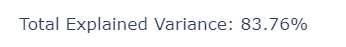

In [114]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))


s_val =unsampled_df_with_pcs.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
    row=1, col=1
)


s_val =unsampled_df_with_pcs.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations With PC\'s")
fig.show()